In [1]:
import pyedflib
import numpy as np
import pandas as pd
import mne
from matplotlib.pyplot import figure
%matplotlib inline
import matplotlib.pyplot as plt

from mne.datasets import eegbci
import os
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ShuffleSplit
from mne.decoding import CSP
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.model_selection import cross_val_score
import pytorch_lightning as pl
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
path = '/Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data'
runs = [5, 9, 13] # Моторное исполнение: руки vs ноги
raw_names = []
for sub in range(1,100):
    if sub not in [88, 92, 100]: #битые файлы
        name = eegbci.load_data(sub, runs, path = path)
        raw_names.append(name)

In [3]:
# Подгружаем все файлы
all_data = []
for names in raw_names:
    for file in names:
        all_data.append(mne.io.read_raw_edf(file, preload=True, stim_channel='auto'))

# all_data.append(mne.io.read_raw_edf(raw_names[0][0], preload=True, stim_channel='auto'))

Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/

EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S010/S010R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S010/S010R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S011/S011R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679 

Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S019/S019R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S019/S019R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S020/S020R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/

EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S028/S028R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S029/S029R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19839  =      0.000 ...   123.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S029/S029R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19839 

Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S037/S037R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S038/S038R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S038/S038R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/

EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S047/S047R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S047/S047R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S047/S047R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679 

Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S056/S056R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S056/S056R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S056/S056R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/

EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S065/S065R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S065/S065R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S066/S066R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999 

Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S074/S074R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S074/S074R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S075/S075R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/

EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S083/S083R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S084/S084R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S084/S084R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679 

Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S094/S094R13.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19679  =      0.000 ...   122.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S095/S095R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S095/S095R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /Users/ila/Desktop/Python/my projects/total-perspective-vortex/mne_data/

In [4]:
# Объединяем в один стэк данных для простоты работы
# у нас остались 64 датчика, только теперь они включают в себя объединенную инфу по каждому датчику по всем файлам
raw = mne.concatenate_raws(all_data)
# Стандартизируйте позиции и названия каналов
eegbci.standardize(raw)
# убрали точки в названии каналов и насторили порядок

In [5]:
montage = mne.channels.make_standard_montage('standard_1005')
raw.set_montage(montage)

# raw.filter(7., 30., method='iir') # применяем фильтрацию из прошлого раздела

<RawEDF | S001R05.edf, 64 x 5745120 (35907.0 s), ~2.74 GB, data loaded>

In [6]:
events, ev_id = mne.events_from_annotations(raw) 
events[:10], events.shape

Used Annotations descriptions: ['T0', 'T1', 'T2']


(array([[   0,    0,    1],
        [ 672,    0,    3],
        [1328,    0,    1],
        [2000,    0,    2],
        [2656,    0,    1],
        [3328,    0,    3],
        [3984,    0,    1],
        [4656,    0,    2],
        [5312,    0,    1],
        [5984,    0,    3]]),
 (8730, 3))

In [7]:
ev_id

{'T0': 1, 'T1': 2, 'T2': 3}

In [8]:
# pick_types отбирает нам хорошие и плохие каналы 
# exclude='bads' - добавлять плохие каналы в raw.info['bads']
picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False,
                   exclude='bads')

In [9]:
picks, raw.info['bads']

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63]),
 [])

In [10]:
event_ids = dict(rest=1, hands=2, feet=3)
event_ids

{'rest': 1, 'hands': 2, 'feet': 3}

In [11]:
tmin, tmax = 0.1, 4.
epochs = mne.Epochs(raw, events, event_ids,tmin, tmax, picks=picks, preload=True, proj=True, baseline=None)

Not setting metadata
Not setting metadata
8730 matching events found
No baseline correction applied
0 projection items activated
Loading data for 8730 events and 625 original time points ...
27 bad epochs dropped


In [12]:
labels = epochs.events[:, -1] # возращаемся к нашим events и берем от туда целевую переменную 
labels[:5]

array([1, 3, 1, 2, 1])

In [13]:
epochs_data_train = epochs.get_data() # 
epochs_data_train.shape, len(labels)

((8703, 64, 625), 8703)

## Посмотрим как в среднем ведет себя волна

In [14]:
labels == 1

array([ True, False,  True, ..., False,  True, False])

In [15]:
len(epochs_data_train[labels == 2])

2158

In [16]:
rest = epochs_data_train[labels == 1]
hands = epochs_data_train[labels == 2]
feet = epochs_data_train[labels == 3]


In [30]:
hands.shape, feet.shape, rest.shape

((2158, 64, 625), (2180, 64, 625), (4365, 64, 625))

<ipython-input-33-18ae6309578c>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,10))


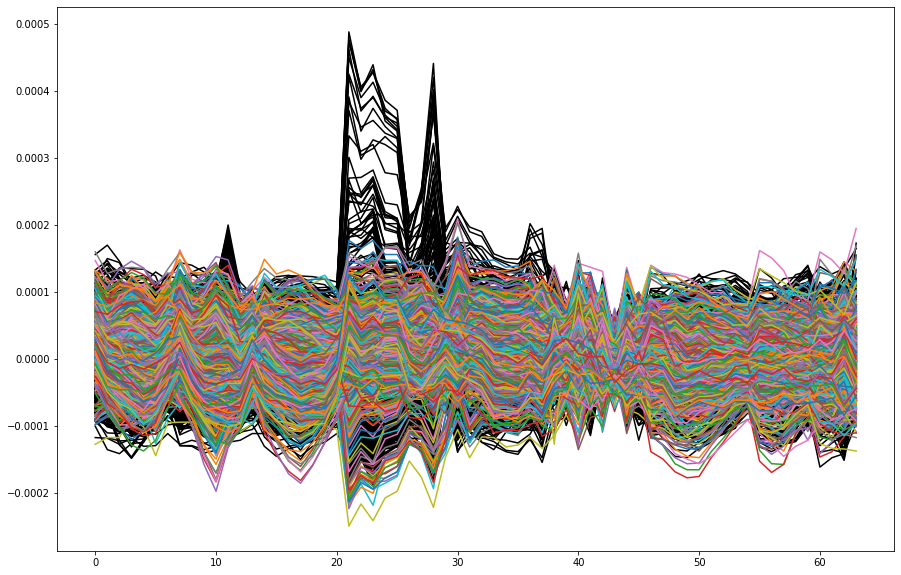

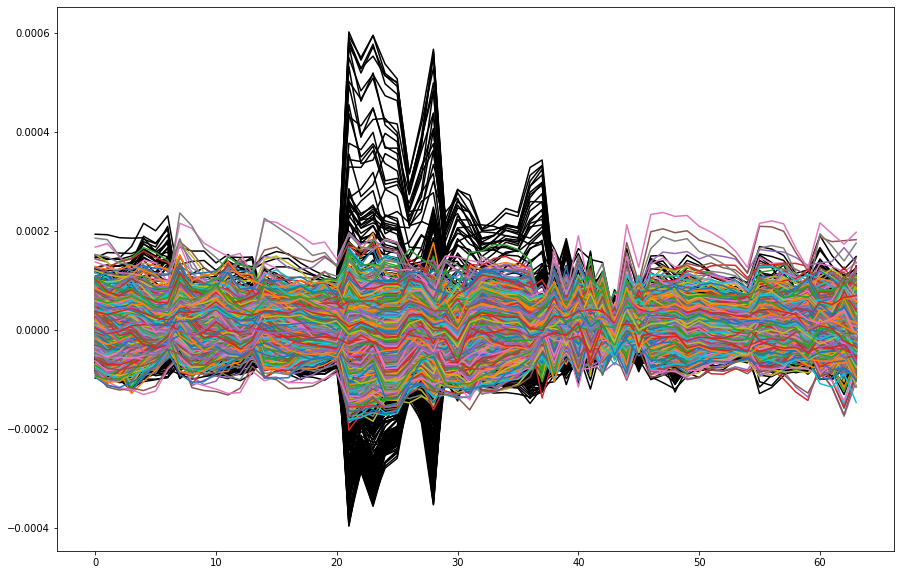

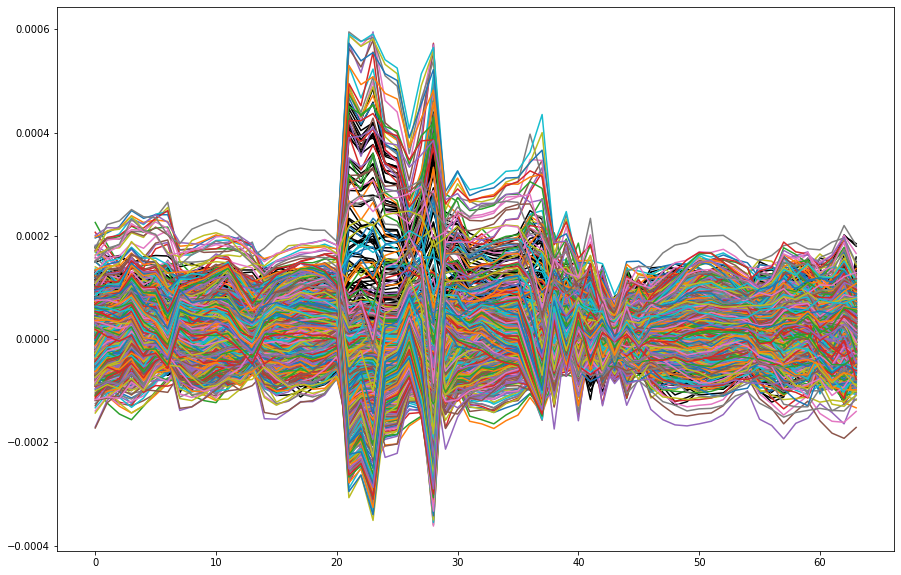

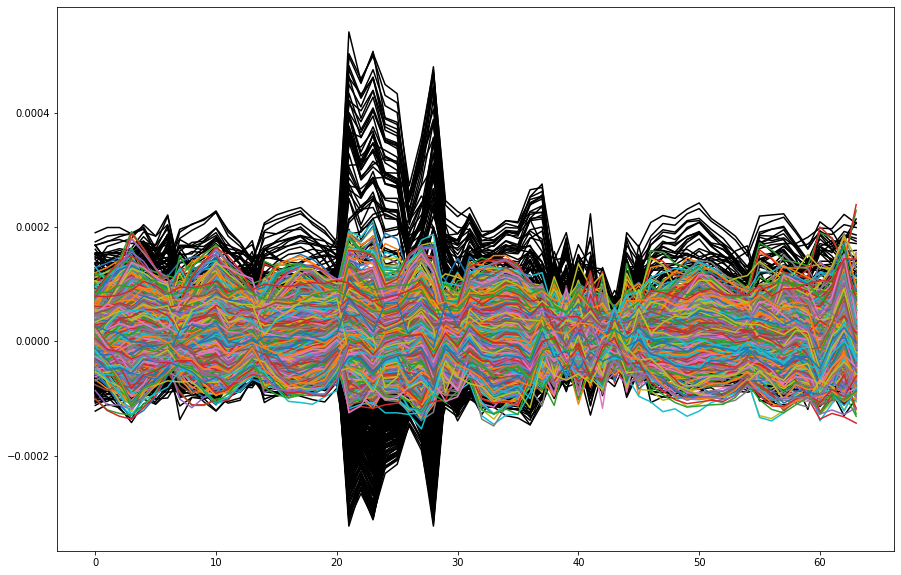

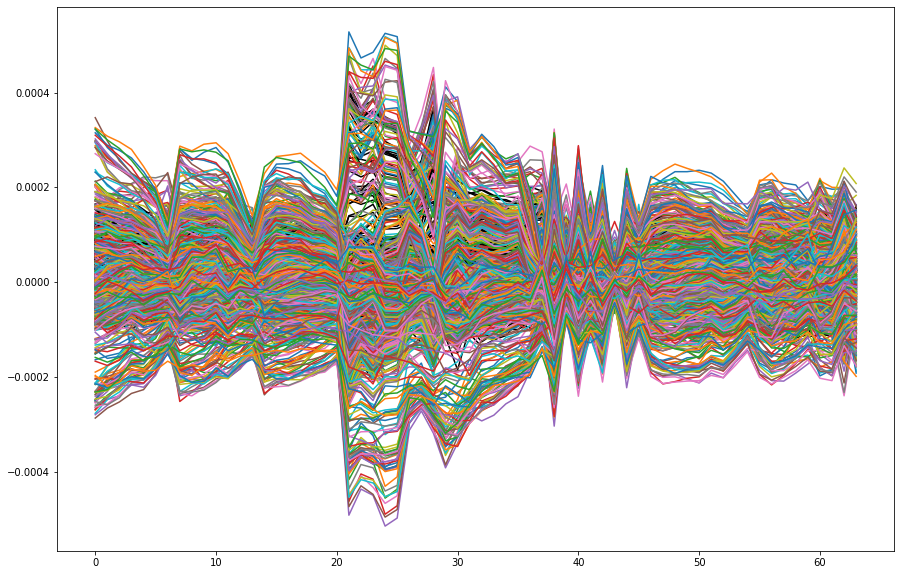

...

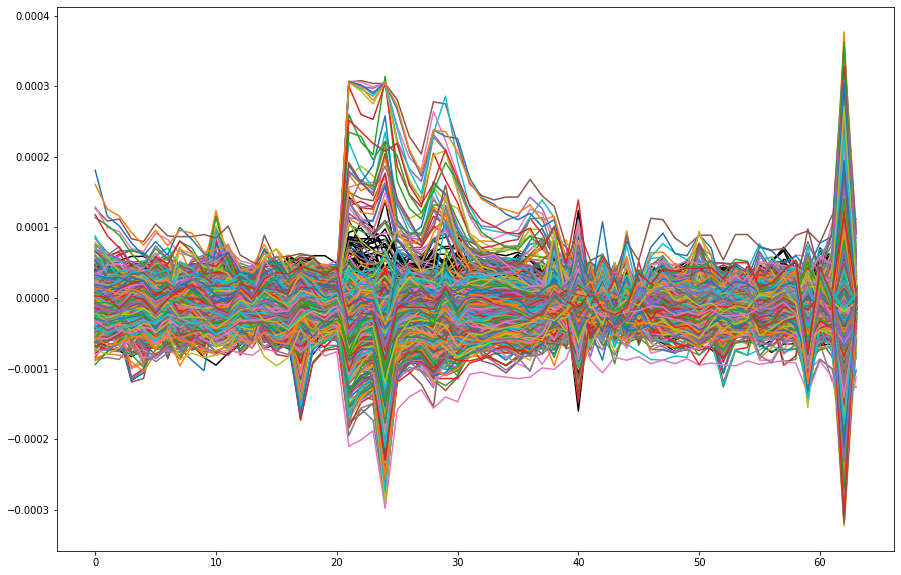

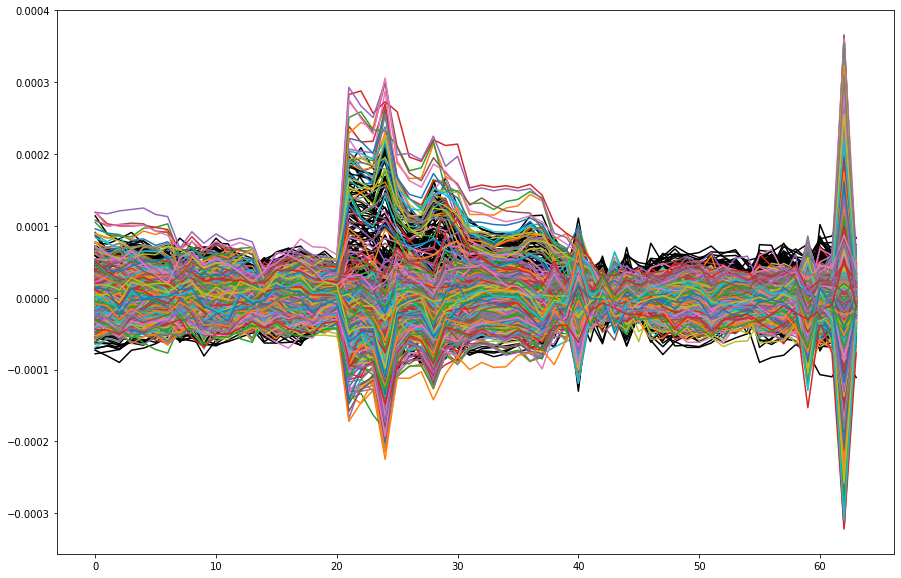

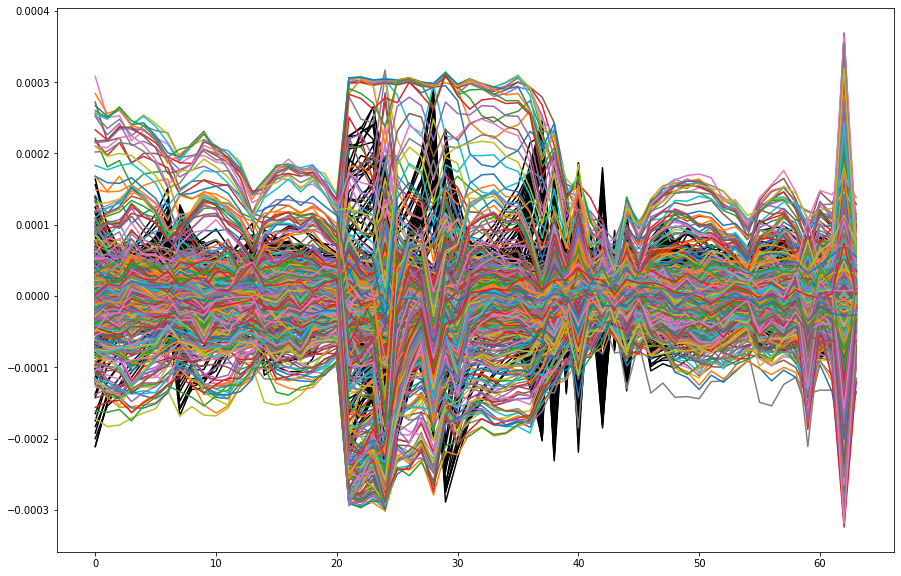

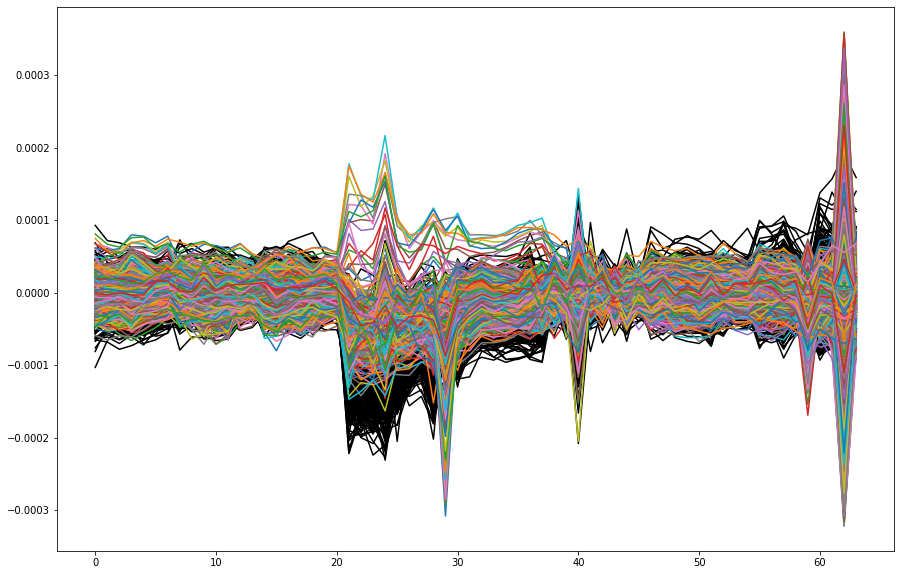

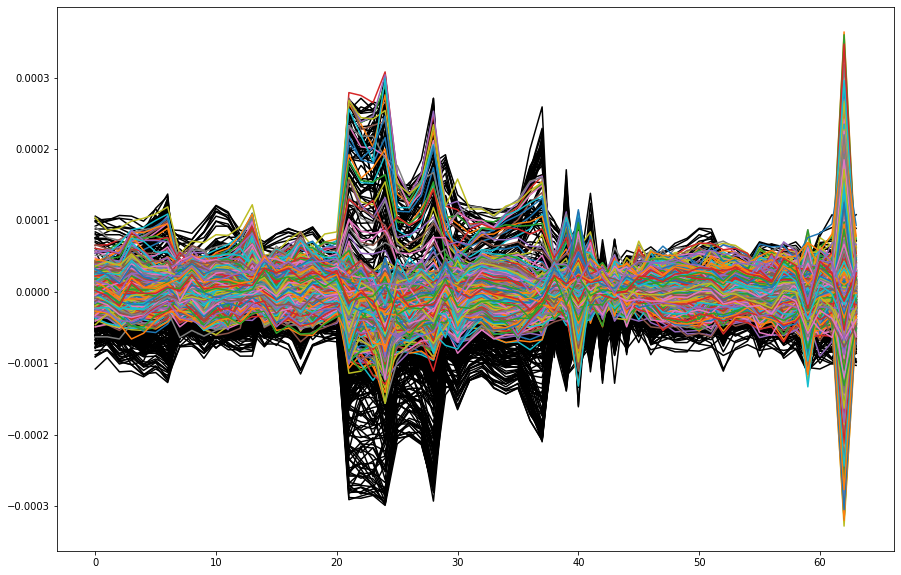

In [33]:
for i in range(30):
    plt.figure(figsize=(15,10))
    plt.plot(hands[i], color = 'black')
    plt.plot(feet[i])
plt.show()

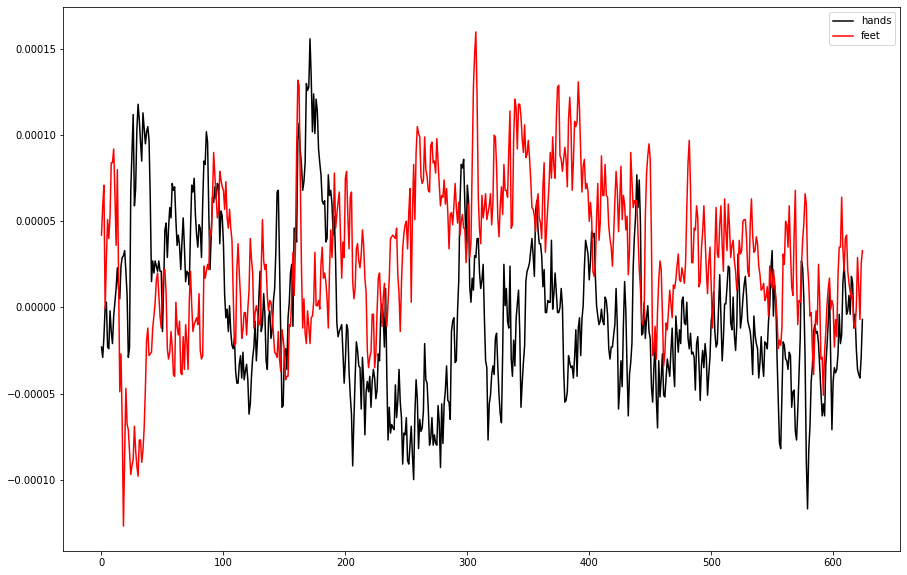

In [23]:
plt.figure(figsize=(15,10))
plt.plot(hands[0][0], label='hands', color='black')
plt.plot(feet[0][0], label='feet', color='red')
plt.legend()

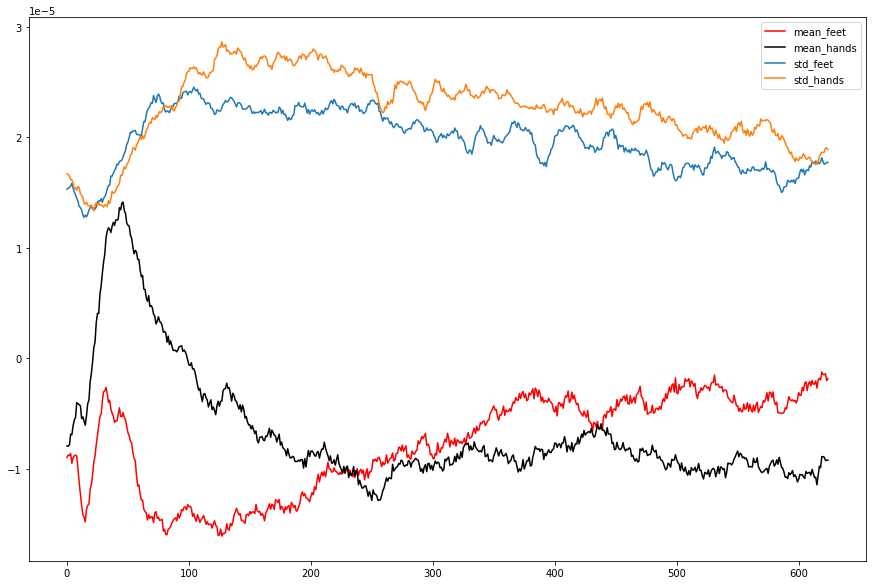

In [42]:
plt.figure(figsize=(15,10))
# plt.plot(rest.mean(axis=0).mean(axis=0), label='rest', color='green')
plt.plot(feet.mean(axis=0).mean(axis=0), label='mean_feet', color='red')
plt.plot(hands.mean(axis=0).mean(axis=0), label='mean_hands', color='black')
plt.plot(feet.std(axis=0).std(axis=0), label='std_feet')
plt.plot(hands.std(axis=0).std(axis=0), label='std_hands')
plt.legend()

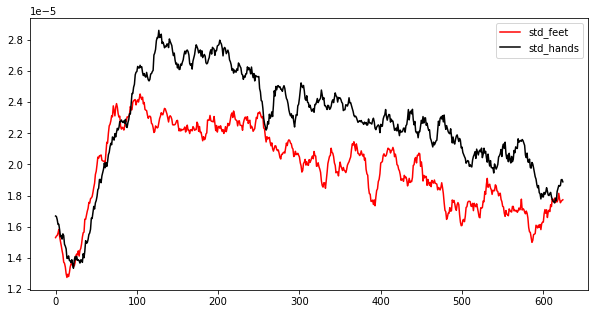

In [40]:
plt.figure(figsize=(10,5))
plt.plot(feet.std(axis=0).std(axis=0), label='std_feet', color='red')
plt.plot(hands.std(axis=0).std(axis=0), label='std_hands', color='black')
plt.legend()

In [66]:
feet[:, :, 0].shape

(2180, 64)

In [76]:
feet[:, 0, 0]

array([ 4.2e-05, -1.6e-05,  5.4e-05, ...,  6.7e-05,  7.4e-05, -1.5e-05])

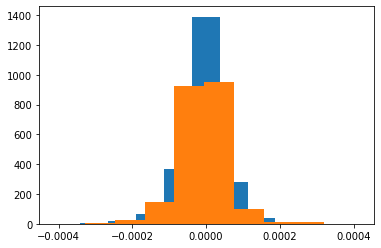

In [83]:
plt.hist(feet[:, 0, 0])
plt.hist(feet[:, 0, 2])
plt.show()

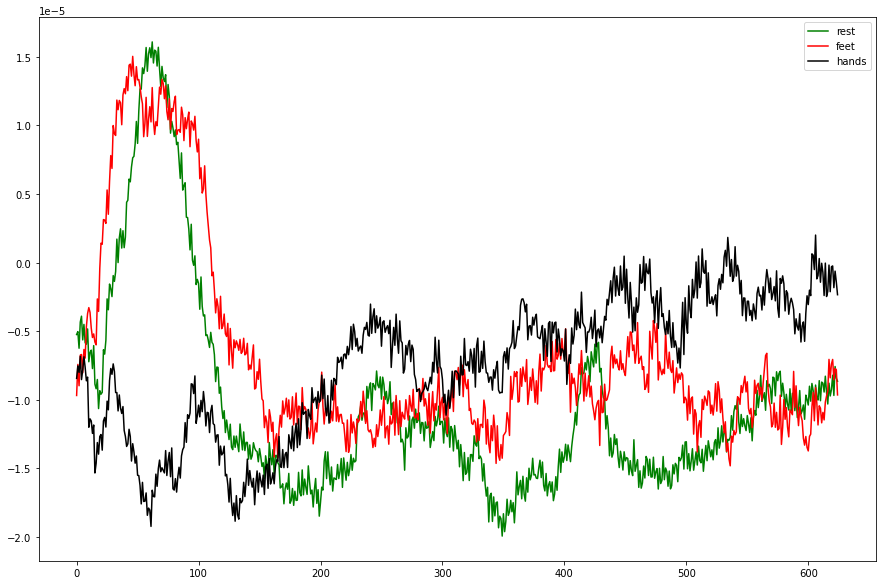

In [101]:
plt.figure(figsize=(15,10))
plt.plot(rest.mean(axis=0).mean(axis=0), label='rest', color='green')
plt.plot(feet.mean(axis=0).mean(axis=0), label='feet', color='red')
plt.plot(hands.mean(axis=0).mean(axis=0), label='hands', color='black')
plt.legend()

In [53]:
np.array([[3,2],
          [7,4]]).mean(axis=1)

array([2.5, 5.5])